# A Very Bullish Market
When dairy farmers decide to breed their cows, they have several dairy bulls to choose from. The data set you have contains bulls with genetic indices that describe its production, health, and physical characteristics:

Production
- pta_milk, a measure of milk output.
- pta_fat_lb, a measure of fat output (a component of milk).
- pta_protein_lb, a measure of protein output (a component of protein).

Health
- pta_scs, a measure of udder health.
- pta_dpr, a measure of fertility.

The goal of this assignment is to characterize the market for bull genetics. The data can be found in the Box folder.

### Part 1: Unsupervised Learning (5 points)
1. First apply PCA to the space of bull traits. What is the best choice of K? Do the components seem meaningful?
2. Next apply K-means clustering to the first two principal components. What is the best choice of K? Do the groupings give any good information?

### Part 2: Supervised Learning (5 points)
1. To study the characteristics that matter to price, apply a LASSO regression model to discover which traits predict price the best. What did you find?
2. Calibrate a Random Forest model to predict price using traits and any other relevant information. Which hyperparameters give the best predictions?
3. Finally, use your Random Forest model to predict price for those observations where price is missing. What do you predictions look like? Do they look sensible?


# Atharva Rajadnya
asr6@illinois.edu

# Part 1

# 1

In [123]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet, ElasticNetCV
from sklearn.linear_model import LassoCV
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV

from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn import datasets
from sklearn.datasets import make_blobs
import os
os.environ["OMP_NUM_THREADS"] = '2'

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.express as px

In [124]:
# Reading in the data

data = pd.read_csv('dairy_bull_data.csv')

data.head()

,breed,country_of_origin,sire_code,period,price,birth_date,pta_milk,pta_fat_lb,pta_scs,pta_protein_lb,pta_dpr
0,AY,CAN,18491,2000-02-01,12.0,1991-10-20,1124.0,41.0,3.32,32.0,NaN
1,AY,CAN,18493,2000-02-01,18.0,1992-06-15,1664.0,44.0,2.92,35.0,NaN
2,AY,CAN,18697,2000-02-01,12.0,1992-05-30,939.0,45.0,2.87,27.0,NaN
3,AY,CAN,18696,2000-02-01,12.0,1992-06-25,660.0,30.0,3.28,21.0,NaN
4,AY,CAN,18494,2000-02-01,15.0,1992-10-25,259.0,26.0,3.18,6.0,NaN


In [125]:
# Cleaning the dataset

data.dropna(inplace=True)
data.drop_duplicates(inplace=True)

data.head()

,breed,country_of_origin,sire_code,period,price,birth_date,pta_milk,pta_fat_lb,pta_scs,pta_protein_lb,pta_dpr
152,AY,CAN,18702,2003-02-01,18.0,1994-11-15,1491.0,66.0,2.90,45.0,0.0
153,AY,CAN,12567,2003-02-01,12.0,1994-05-08,1491.0,44.0,2.91,34.0,0.2
154,AY,CAN,18704,2003-02-01,15.0,1995-05-10,1421.0,38.0,3.27,39.0,-1.9
155,AY,CAN,18707,2003-02-01,20.0,1996-06-02,1174.0,65.0,2.66,42.0,0.7
156,AY,CAN,7612,2003-02-01,20.0,1996-12-02,639.0,35.0,2.94,27.0,0.5


In [126]:
# PCA analysis

K = 5

X = data[['pta_milk', 'pta_fat_lb', 'pta_protein_lb', 'pta_scs', 'pta_dpr']]
X_scaled = (X - X.mean()) / X.std()

pca = PCA(K)
pca.fit(X_scaled)

pca.components_

array([[-0.53084824, -0.52347716, -0.55886811,  0.2681388 , -0.24482613],
       [-0.23447777, -0.17906576, -0.21305912, -0.63976126,  0.67695419],
       [ 0.05360878, -0.03063225, -0.06512134, -0.71883165, -0.68936785],
       [ 0.61252122, -0.77790992,  0.12727451,  0.01193747,  0.05772873],
       [ 0.53400766,  0.29635273, -0.78856367,  0.04410977,  0.05685553]])

Text(0.5, 1.0, 'Portion of Variance Explained')

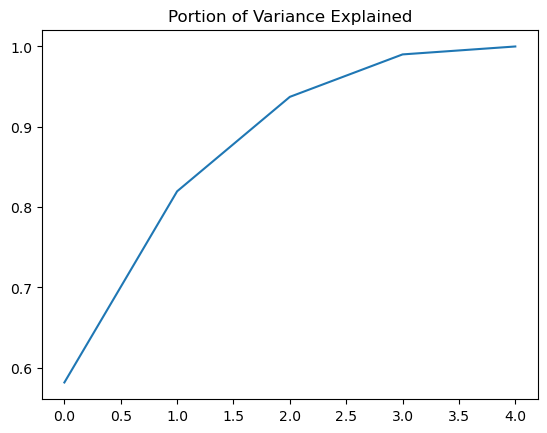

In [127]:
# Plotting variance

plt.plot(list(range(K)),pca.explained_variance_ratio_.cumsum())
plt.title("Portion of Variance Explained")

Text(0.5, 1.0, 'Eigenvalues by Component')

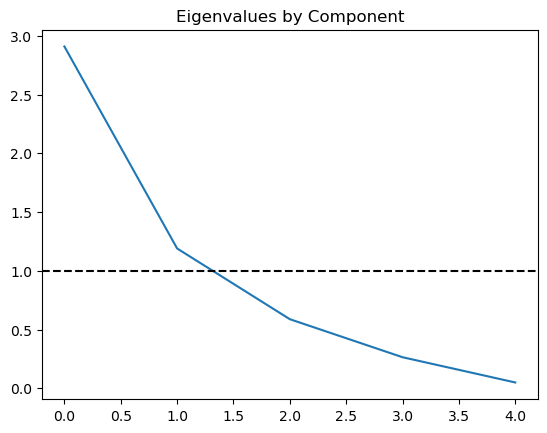

In [128]:
# Plotting eigenvalues

plt.plot(list(range(K)),pca.explained_variance_)

plt.axhline(1,ls="--",color="black")
plt.title("Eigenvalues by Component")

The value of K can be 2. If we choose K = 2, around 80% is accounted for. This means that only 2 components are really meaningful.

In [129]:
# PCA analysis with K = 2

K = 2

X = data[['pta_milk', 'pta_fat_lb', 'pta_protein_lb', 'pta_scs', 'pta_dpr']]
X_scaled = (X - X.mean()) / X.std()

pca = PCA(K)
pca.fit(X_scaled)

pca.components_

load_scores = pd.DataFrame(pca.components_)
load_scores

,0,1,2,3,4
0,-0.530848,-0.523477,-0.558868,0.268139,-0.244826
1,-0.234478,-0.179066,-0.213059,-0.639761,0.676954


In [130]:
# Most meaningful components

pca.explained_variance_ratio_

array([0.58176261, 0.23796386])

In [131]:
load_scores.columns = X_scaled.columns

load_scores.T.sort_values(0,ascending=False)

,0,1
pta_scs,0.268139,-0.639761
pta_dpr,-0.244826,0.676954
pta_fat_lb,-0.523477,-0.179066
pta_milk,-0.530848,-0.234478
pta_protein_lb,-0.558868,-0.213059


In [132]:
class PCA_Model:
    def __init__(self,ncomps,data,cols):
        
        self.ncomps = ncomps
        self.cols = cols
        self.data = data
        self.scaled_data = StandardScaler().fit_transform(data[cols].values)
        
    def fit(self):
        self.PCA_obj = PCA(self.ncomps).fit(self.scaled_data)
    
    def describe(self):
        explvar_ = self.PCA_obj.explained_variance_ratio_

        explvar = pd.DataFrame(explvar_[np.newaxis,:]*100,\
                               columns=["Component " + str(x) for x in range(self.ncomps)],\
                               index=["% Explained Variance"])
        
        loadscores_ = self.PCA_obj.components_
        loadscores = pd.DataFrame(loadscores_,\
                                  columns=self.cols,\
                                  index=["Component " + str(x) for x in range(self.ncomps)])
        print("Explains {0:0.2f}% of the variance".format(round(sum(explvar_),2)*100))
        print(explvar)
        print(loadscores)
        return explvar,loadscores
    
    def gen_data(self):
        return self.PCA_obj.transform(self.scaled_data)
    
    def graph(self,alpha=.6):
        self.graphdata = pd.concat([self.data[[color]].reset_index(drop=True),\
                                    pd.DataFrame(self.gen_data()).reset_index(drop=True)],axis=1)
        if self.ncomps==2:
            return self.graphdata.plot(kind="scatter",x=0,y=1,\
                                       c=color,alpha=alpha,colormap=cm)
        else:
            ax = plt.axes(projection='3d')
            ax.scatter3D(self.graphdata[0], \
                         self.graphdata[1], \
                         self.graphdata[2])#, \
                         #c=color,colormap=cm)

In [133]:
# PCA Model

pca4 = PCA_Model(2,X.fillna(0),X.columns)
pca4.fit()

var,load_scores = pca4.describe();

Explains 82.00% of the variance
                      Component 0  Component 1
% Explained Variance    58.176261    23.796386
             pta_milk  pta_fat_lb  pta_protein_lb   pta_scs   pta_dpr
Component 0 -0.530848   -0.523477       -0.558868  0.268139 -0.244826
Component 1 -0.234478   -0.179066       -0.213059 -0.639761  0.676954


pta_scs and pta_dpr are the most meaningful components

# 2

In [134]:
class Kmeans_Model:
    def __init__(self,data,num_clusters):
        self.df = StandardScaler().fit_transform(data)
        self.K = num_clusters
        
    def fit(self):    
        self.model = KMeans(self.K,n_init=2).fit(self.df)
    
    def predict(self):
        self.prediction = self.model.predict(self.df)
        return self.prediction
    
    def sil_score(self):
        return silhouette_score(self.df,self.model.predict(self.df),sample_size=10000)
    
def score_by_k(data,K):
    model = Kmeans_Model(data,K)
    model.fit()
    return model.sil_score()

def inertia_by_k(data,K):
    model = Kmeans_Model(data,K)
    model.fit()
    return model.model.inertia_

In [135]:
kmeans = KMeans(2)

kmeans = kmeans.fit(X_scaled)
X_scaled['cluster'] = kmeans.predict(X_scaled)

Text(0.5, 1.0, 'Silhouette Score')

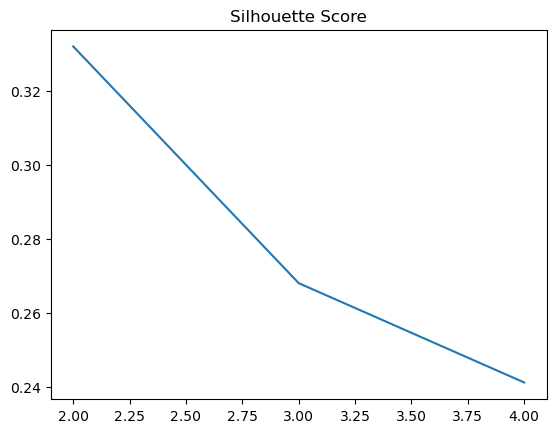

In [136]:
# Silhouette scores

scores = [score_by_k(X,x) for x in range(2,5)]

plt.plot(list(range(2,5)),scores)
plt.title("Silhouette Score")

Text(0.5, 1.0, 'Inertia Score')

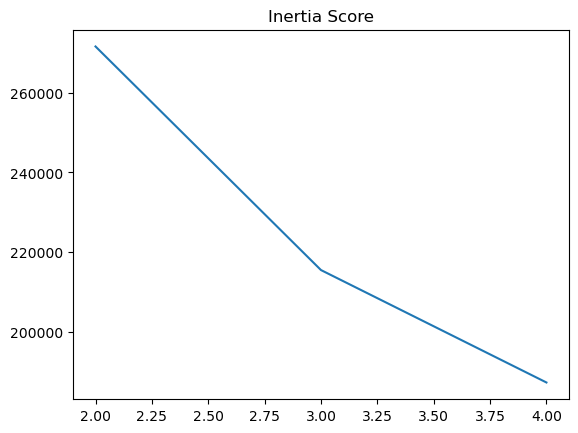

In [137]:
# Inertia scores

inertia_scores = [inertia_by_k(X,x) for x in range(2,5)]

plt.plot(list(range(2,5)),inertia_scores)
plt.title("Inertia Score")

In [138]:
X_scaled.groupby("cluster").mean()

,pta_milk,pta_fat_lb,pta_protein_lb,pta_scs,pta_dpr
cluster,,,,,
0,-0.629332,-0.636406,-0.668523,0.421561,-0.368672
1,0.792775,0.801686,0.842144,-0.531044,0.464420


In [139]:
# Scatter plot

px.scatter_3d(X_scaled,x='pta_scs',y='pta_protein_lb',z='pta_fat_lb',color='cluster')

The groupings do not give any significant information.

# Part 2

# 1

In [140]:
# Reading in the data

data = pd.read_csv('dairy_bull_data.csv')

# Cleaning the dataset

data.dropna(inplace=True)
data.drop_duplicates(inplace=True)

data

,breed,country_of_origin,sire_code,period,price,birth_date,pta_milk,pta_fat_lb,pta_scs,pta_protein_lb,pta_dpr
152,AY,CAN,18702,2003-02-01,18.0,1994-11-15,1491.0,66.0,2.90,45.0,0.0
153,AY,CAN,12567,2003-02-01,12.0,1994-05-08,1491.0,44.0,2.91,34.0,0.2
154,AY,CAN,18704,2003-02-01,15.0,1995-05-10,1421.0,38.0,3.27,39.0,-1.9
155,AY,CAN,18707,2003-02-01,20.0,1996-06-02,1174.0,65.0,2.66,42.0,0.7
156,AY,CAN,7612,2003-02-01,20.0,1996-12-02,639.0,35.0,2.94,27.0,0.5
...,...,...,...,...,...,...,...,...,...,...,...
167017,WW,USA,18407,2015-08-01,26.0,2003-02-10,-270.0,-11.0,2.63,-19.0,3.2
167018,WW,NLD,22830,2019-08-01,26.0,2004-09-11,-313.0,34.0,3.14,19.0,-1.0
167019,WW,NLD,22830,2019-12-01,26.0,2004-09-11,-186.0,38.0,3.24,22.0,-1.4
167020,WW,NLD,22830,2020-04-01,26.0,2004-09-11,-610.0,19.0,3.23,12.0,-1.8


In [141]:
# Features

features = list(data.columns[[6, 7, 8, 9, 10]])

len(features)

5

In [142]:
# Scaling

X = StandardScaler().fit_transform(data[features])

y = StandardScaler().fit_transform(data[['price']])

In [143]:
# Lasso model

lasso_model = Lasso(alpha=0.1)

lasso_model = lasso_model.fit(y=y,X=X)

In [144]:
lasso_model.coef_

array([ 0.        ,  0.1522524 , -0.02352817,  0.0795412 ,  0.00405441])

In [145]:
bool_ = lasso_model.coef_!=0

print(sum(bool_))
data[features].iloc[:,bool_].columns

4


Index(['pta_fat_lb', 'pta_scs', 'pta_protein_lb', 'pta_dpr'], dtype='object')

In [146]:
def get_coefs(alpha,features,target):
    X = StandardScaler().fit_transform(data[features])
    y = StandardScaler().fit_transform(data[target])
    
    lasso_model =Lasso(alpha=alpha)
    lasso_model = lasso_model.fit(y=y,X=X)
    
    coefs = lasso_model.coef_
    
    return coefs

Alpha = np.arange(0,1,.01)

coef_lists = [list(get_coefs(a,data[features].iloc[:,bool_].columns,["price"])) for a in Alpha]

/var/folders/_d/_3n207px5t7bmqg02j6l0qsc0000gn/T/ipykernel_10966/2341719793.py:6: UserWarning:

With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator

/Users/atharvarajadnya/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:647: UserWarning:

Coordinate descent with no regularization may lead to unexpected results and is discouraged.

/Users/atharvarajadnya/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.917e+04, tolerance: 8.955e+00 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.



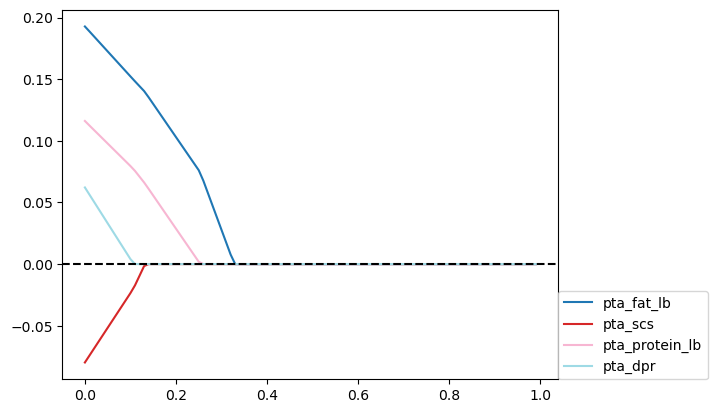

In [147]:
# Plotting

Coefs = pd.DataFrame(coef_lists)

Coefs.columns = data[features].iloc[:,bool_].columns
Coefs.index=Alpha

Coefs.plot(cmap="tab20")
plt.legend(loc=(1,0))
plt.axhline(0,ls="--",color="black")

pta_fat_lb, pta_protein_lb and pta_dpr best predict the price of milk.

# 2

In [148]:
# Random forest

param_grid = {
    'n_estimators': np.arange(100, 150, 10),
    'max_depth': np.arange(10, 60, 10),
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False]
}

In [ ]:
rf = RandomForestRegressor()

random_search = RandomizedSearchCV(estimator=rf, param_distributions=param_grid, n_iter=1, cv=1, random_state=42)
rf_random.fit(X,y)

/Users/atharvarajadnya/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/atharvarajadnya/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/atharvarajadnya/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/atharvarajadnya/opt/anaconda3/lib/python3.9/site-packages

In [ ]:
rf_random.best_params_

# 3

In [ ]:
data['y_rf'] = rf_random.predict(X)

data['y_rf']

In [ ]:
# Plotting

data['y'] = y

data[['y','y_rf']].plot(kind='scatter',y="y",x='y_rf',alpha=.35)
plt.plot(np.linspace(-2,7,10),np.linspace(-2,7,10),color="black",ls="--")

In [ ]:
rmse_rf = ((data['y'] - data['y_rf'])**2).mean()**.5

In [ ]:
X_test = test[features].values

test['price'] = rf_random.predict(X_test)

In [ ]:
# Plotting histograms

test.sale_price_pred.plot(kind="hist",bins=30,alpha=.3)
data['y'].plot(kind="hist",bins=40,color='C3',alpha=.3)